<a href="https://colab.research.google.com/github/StefanoGiacomelli/PRA_RIR_Conv/blob/main/PRA_Dataset_Synthesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**TITLE:** Room Acoustic Field Simulation & Features Extraction

**AUTHORS:** S.Giacomelli, M.Giordano, C.Rinaldi

**AFFILIATION:** Università degli Studi di L'Aquila, DISIM Dept.

**DATE:** 29/02/2024

---

***DESCRIPTION:*** Python scripts for Room Architectures extrusion, Microphone set-up & (moving) source trajectory ISM simulations, RIR extraction & (Time-varying) convolution computations

# Packages
- [`PyRoomAcoustics`](https://pyroomacoustics.readthedocs.io/en/pypi-release/) *(CPU-based)*
    - [R. Scheibler et al. - "PyRoomAcoustics"](https://www.robinscheibler.org/pdf/poster_2018_pyroomacoustics.pdf) (POSTER)
    - [R. Scheibler et al. - "Pyroomacoustics: A Python Package for Audio Room Simulation and Array Processing Algorithms"](https://ieeexplore.ieee.org/document/8461310) (IEEE paper)
    - [PyRoomAcoustics](https://github.com/LCAV/pyroomacoustics) (GitHub Repository)

In [1]:
from copy import copy
from time import perf_counter
from numba import jit
import soundfile as sf
import numpy as np
import scipy.signal as signal

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import IPython

In [2]:
!pip install pyroomacoustics
import pyroomacoustics as pra
from pyroomacoustics.directivities import (DirectivityPattern, DirectionVector, CardioidFamily)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.12.0-py3-none-any.whl (234 kB)
  Created wheel for pyroomacoustics: filename=pyroomacoustics-0.7.4-cp310-cp310-linux_x86_64.whl size=13118532 sha256=6935e4000d7ed050a21e4f4495b2a1ffd7bdf32706350ebd3edca104b8a19b13
  Stored in directory: /root/.cache/pip/wheels/6b/92/36/f1271d3174f18202ddf18ce1bf314333d6a581b742be15fd3a
Successfully built pyroomacoustics


# Input Parameters

1. ANECHOIC Shoebox

```
- Humidity: 0%
- Temperature: 20°C
- SR: 44.1KHz (according to audio sample)
- Microphone: Frontal *Cardioid* (monaural)
- Elevation: 1.7m
- ISM order: 10th
- ROOM materials: ALL `anechoic`
- File: `adult_female_speech.wav`
- Trajectory: Rectilinear (starting at 1m from microphone, to the pseudo-end of the room)
```
---

2. REVERBERANT Non-symmetric Room

\begin{align}
    Time_{(Complexity)} = 6min_{(ISM+RIRs)}
\end{align}

```
- Humidity: 5%
- Temperature: 20°C
- SR: 44.1KHz (from audio sample)
- Microphone: Frontal *Cardioid* (monaural)
- Elevation: 1.7m
- ISM order: 12th
- ROOM materials:
    - floor: wooden linings
    - ceiling: ceramic tiles
    - walls: limestone
- File: `adult_female_speech.wav`
- Trajectory: Rectilinear (starting at 1m from microphone, to the pseudo-end of the room)
```
---

In [3]:
# # EXAMPLE 1 (ANECHOIC Monaural Shoebox)
#
# # Geometry (Perimeter - Height)
# corners = [[0, 0], [0, 20], [20, 20], [20, 0]]                                  # Perimeter Coordinates (in meters)
# height = 3                                                                      # in meters
#
# # Materials & Air
# ceiling_mat = {"description": "Anechoic Material",
#                 "coeffs": [1., 1., 1., 1., 1., 1., 1., 1.],
#                 "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
# floor_mat   = {"description": "Anechoic Material",
#                 "coeffs": [1., 1., 1., 1., 1., 1., 1., 1.],
#                 "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
# walls_mat   = {"description": "Anechoic Material",
#                 "coeffs": [1., 1., 1., 1., 1., 1., 1., 1.],
#                 "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
# humidity_perc = 0                                                               # in %
# temperature = 20                                                                # in C°
#
# # Simulation parameters
# sr = 44100                                                                      # in Hz (...according to source file SR)
# ism_order = 10                                                                  # Maximum order
#
# # Source Audio File
# file_path = './adult_female_speech_44100_24.wav'
# # Source Trajectory
# start_point = [10, 2]                                                           # 1m distance, centered w.r.t. microphone
# end_point = [10, 19.5]                                                          # 17.5m, departing
# speed = 1.00                                                                    # in m/s
# sampling_interval = 0.05                                                        # in sec.
# duration = 16                                                                   # in sec.
#
# # Microphone set-up
# mic_coords = [10, 1]
# elevation = 1.7                                                                 # in meters (mid-Human)
# azimuth = 90                                                                    # in °
# colatitude = 90                                                                 # in °
# mic_pattern = DirectivityPattern.CARDIOID                                       # Mic-pattern
# directivity = CardioidFamily(orientation=DirectionVector(azimuth=azimuth, colatitude=colatitude, degrees=True),
#                              pattern_enum=mic_pattern)

In [4]:
# EXAMPLE 2 (REVERBERANT Monaural Non-symmetric Room)

# Geometry (Perimeter - Height)
corners = [[0, 0], [7, 20], [6*np.pi, 17.3], [20, 0]]                           # Perimeter Coordinates (in meters)
height = 3                                                                      # in meters

# Materials & Air
ceiling_mat = {"description": "wooden_lining",
                "coeffs": [0.27, 0.23, 0.22, 0.15, 0.1, 0.07, 0.06, 0.04],      # descending 0.06 inferred at 16KHz
                "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
floor_mat   = {"description": "ceramic_tiles",
                "coeffs": [0.01, 0.01, 0.01, 0.02, 0.02, 0.02, 0.02, 0.03],     # rising 0.03 inferred at 16KHz
                "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
walls_mat   = {"description": "limestone_wall",
                "coeffs": [0.02, 0.02, 0.03, 0.04, 0.05, 0.05, 0.05, 0.06],     # rising 0.06 inferred at 16KHz
                "center_freqs": [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
humidity_perc = 50                                                              # in %
temperature = 20                                                                # in C°

# Simulation parameters
sr = 44100                                                                      # in Hz (...according to source file SR)
ism_order = 12                                                                  # Maximum order

# Source Audio File
file_path = './adult_female_speech_44100_24.wav'
# Source Trajectory
start_point = [10, 2]                                                           # 1m distance, centered w.r.t. microphone
end_point = [10, 15.5]                                                          # 17.5m, departing
speed = 1.41 / 3                                                                # in m/s
sampling_interval = 0.05                                                        # in sec.
duration = 16                                                                   # in sec.

# Microphone set-up
mic_coords = [10, 1]
elevation = 1.7                                                                 # in meters (mid-Human)
azimuth = 90                                                                    # in °
colatitude = 90                                                                 # in °
mic_pattern = DirectivityPattern.CARDIOID                                       # Mic-pattern
directivity = CardioidFamily(orientation=DirectionVector(azimuth=azimuth, colatitude=colatitude, degrees=True),
                             pattern_enum=mic_pattern)

In [5]:
pra.materials_data                                                              # PRA available Materials

{'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000],
 'absorption': {'Massive constructions and hard surfaces': {'hard_surface': {'description': 'Walls, hard surfaces average (brick walls, plaster, hard floors, etc.)',
    'coeffs': [0.02, 0.02, 0.03, 0.03, 0.04, 0.05, 0.05]},
   'brickwork': {'description': 'Walls, rendered brickwork',
    'coeffs': [0.01, 0.02, 0.02, 0.03, 0.03, 0.04, 0.04]},
   'rough_concrete': {'description': 'Rough concrete',
    'coeffs': [0.02, 0.03, 0.03, 0.03, 0.04, 0.07, 0.07]},
   'unpainted_concrete': {'description': 'Smooth unpainted concrete',
    'coeffs': [0.01, 0.01, 0.02, 0.02, 0.02, 0.05, 0.05]},
   'rough_lime_wash': {'description': 'Rough lime wash',
    'coeffs': [0.02, 0.03, 0.04, 0.05, 0.04, 0.03, 0.02]},
   'smooth_brickwork_flush_pointing': {'description': 'Smooth brickwork with flush pointing, painted',
    'coeffs': [0.01, 0.01, 0.02, 0.02, 0.02, 0.02, 0.02]},
   'smooth_brickwork_10mm_pointing': {'description': 'Smooth brickwork, 10 m

# Room
- (Non)-Convex Room extrusion
- STL/OBJ Parser: https://github.com/GuitarsAI/TopicsInAudioAndMusicTech/blob/main/basic_room_acoustics_03.ipynb (*TO DO* )
- Sketchup or AutoCAD renderings (w. GPU acceleration): https://reuk.github.io/wayverb/
- Obstacles: https://github.com/enceladus2000/echoslam_acoustics/blob/master/utils/pra_utils.py    https://github.com/enceladus2000/echoslam_acoustics/blob/master/utils/pra_utils_test.py (*TO DO* )


In [6]:
def make_room(corners: np.ndarray, height: float, ceil_mat: dict, floor_mat: dict, walls_mat: dict, hum_perc: int, temp: float, order: int, sr: int, debug: bool = False, **kwargs):
    """
    Create an arbitrary Room object, extruding Perimeter corners
    """
    mat = pra.make_materials(ceiling=ceiling_mat,                               # Materials dictionary
                             floor=floor_mat,
                             walls=walls_mat)

    if debug is True:
        for material in mat:                                                    # Materials Absorption/Scattering report
            print(str(material).upper())
            print('Absorption :', mat[material].energy_absorption)
            print('Scattering :', mat[material].scattering)
            print('------------------------------')
        print()

    # 2D Perimeter
    room_perimeter = pra.Room.from_corners(np.array(corners).T,
                                 fs=sr,
                                 max_order=order,
                                 temperature=temp,
                                 humidity=hum_perc,
                                 air_absorption=True,
                                 use_rand_ism=True,
                                 ray_tracing=False,
                                 materials=mat['walls'])
    room = copy(room_perimeter)                                                 # Room object copy (for extrusion)

    # 3D Extrusion
    room.extrude(height=height,
                 materials=mat)

    if debug is True:
        print(f'Room Volume   : {room.get_volume():.2f} m^3')                   # Surface/Volumetric report
        surfaces = 0
        for i in range(len(room.walls)):
            surfaces += room.wall_area(room.walls[i])
        print(f'Room Surfaces : {surfaces:.2f} m^2')
        print()

    # Plots
    if debug is True:
        fig = plt.figure(figsize=(10, 5))
        ax1 = plt.subplot(121)
        ax2 = plt.subplot(122, projection='3d')

        room_perimeter.plot(ax=ax1)
        ax1.set_title('Room Perimeter')
        ax1.set_xlim([room_perimeter.get_bbox()[0][0] - 1, room_perimeter.get_bbox()[0][1] + 1])
        ax1.set_ylim([room_perimeter.get_bbox()[1][0] - 1, room_perimeter.get_bbox()[1][1] + 1])
        ax1.set_xlabel('Meters')
        ax1.set_ylabel('Meters')

        room.plot(ax=ax2)
        ax2.set_title('Room Volume')
        ax2.set_xlim([room.get_bbox()[0][0] - 1, room.get_bbox()[0][1] + 1])
        ax2.set_ylim([room.get_bbox()[1][0] - 1, room.get_bbox()[1][1] + 1])
        ax2.set_zlim([room.get_bbox()[2][0] - 1, room.get_bbox()[2][1] + 1])
        ax2.set_xlabel('Meters (x-axis)')
        ax2.set_ylabel('Meters (y-axis)')
        ax2.set_zlabel('Meters (z-axis)')

        plt.tight_layout
        plt.show()

    return room, room_perimeter

CEILING
Absorption : {'description': 'wooden_lining', 'coeffs': [0.27, 0.23, 0.22, 0.15, 0.1, 0.07, 0.06, 0.04], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
Scattering : {'coeffs': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
------------------------------
FLOOR
Absorption : {'description': 'ceramic_tiles', 'coeffs': [0.01, 0.01, 0.01, 0.02, 0.02, 0.02, 0.02, 0.03], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
Scattering : {'coeffs': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
------------------------------
WALLS
Absorption : {'description': 'limestone_wall', 'coeffs': [0.02, 0.02, 0.03, 0.04, 0.05, 0.05, 0.05, 0.06], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
Scattering : {'coeffs': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'center_freqs': [125, 250, 500, 1000, 2000, 4000, 8000, 16000]}
------------------

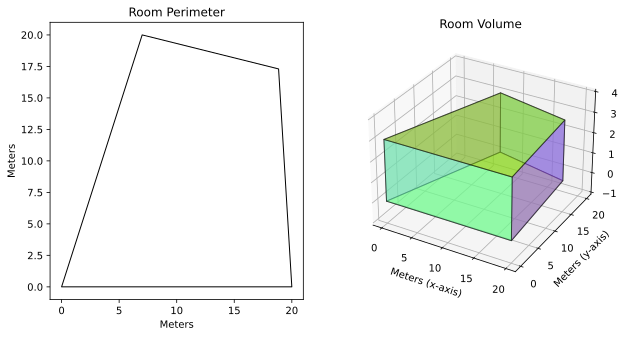

<Figure size 640x480 with 0 Axes>

In [7]:
# Test
room, perimeter = make_room(corners=corners,
                            height=height,
                            ceil_mat=ceiling_mat,
                            floor_mat=floor_mat,
                            walls_mat=walls_mat,
                            hum_perc=humidity_perc,
                            temp=temperature,
                            order=ism_order,
                            sr=sr,
                            debug=True)

# Microphone(s)
1. Single microphone (Monaural)
2. Binaural array


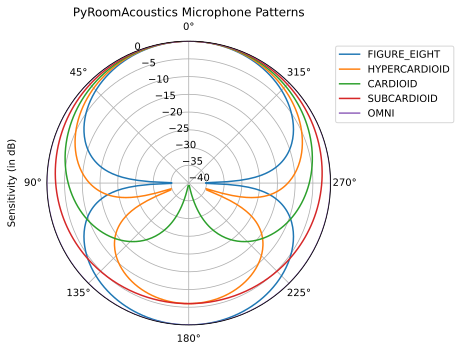

In [8]:
np.seterr(divide = 'ignore')                                                    # Log division Errors warning OFF
angles_array = np.linspace(start=0, stop=360, num=361, endpoint=True)
angles = np.radians(angles_array)
lower_gain = -40                                                                # Plot min Decibel

# Available Patterns plot
fig = plt.figure(figsize=(10, 5))
ax = plt.subplot(111, projection="polar")
for pattern in DirectivityPattern:
    dir_obj = CardioidFamily(orientation=DirectionVector(azimuth=0, colatitude=90, degrees=True),
                             pattern_enum=pattern)
    resp = dir_obj.get_response(azimuth=angles, magnitude=True, degrees=False)  # Magnitude response extraction
    resp_db = 20 * np.log10(np.abs((np.array(resp))))                           # dB conversion
    ax.plot(angles, resp_db, label=pattern.name)
np.seterr(divide = 'warn')                                                      # Revert warnings ON

plt.legend(bbox_to_anchor=(1, 1))
plt.ylim([lower_gain, 0])
plt.ylabel('Sensitivity (in dB)', labelpad=30.)
ax.yaxis.set_ticks(np.arange(start=lower_gain, stop=5, step=5))
ax.set_theta_zero_location("N")
ax.set_title('PyRoomAcoustics Microphone Patterns')

plt.tight_layout()
plt.show()

In [9]:
def single_mic_setup(room_perimeter, room_volume, mic_coords: list, mic_elev: float, directivity, debug: bool = False):
    """
    Place a single Microphone (w. directivity pattern) inside the Room, at specified coordinates
    """
    room.add_microphone([mic_coords[0], mic_coords[1], elevation],
                        directivity=directivity,
                        fs=room.fs)

    # Plot
    if debug is True:
        room_perimeter.add_microphone(mic_coords,
                                      directivity=directivity,
                                      fs=room_perimeter.fs)

        fig = plt.figure(figsize=(10, 5))
        ax1 = plt.subplot(121)
        ax2 = plt.subplot(122, projection='3d')

        room_perimeter.plot(ax=ax1, mic_marker_size=100)
        ax1.set_title("Bird's Eye View")
        ax1.set_xlim([room_perimeter.get_bbox()[0][0] - 1, room_perimeter.get_bbox()[0][1] + 1])
        ax1.set_ylim([room_perimeter.get_bbox()[1][0] - 1, room_perimeter.get_bbox()[1][1] + 1])
        ax1.set_xlabel('Meters')
        ax1.set_ylabel('Meters')

        room.plot(ax=ax2, mic_marker_size=100)
        ax2.set_title('3D View')
        ax2.set_xlim([room.get_bbox()[0][0] - 1, room.get_bbox()[0][1] + 1])
        ax2.set_ylim([room.get_bbox()[1][0] - 1, room.get_bbox()[1][1] + 1])
        ax2.set_zlim([room.get_bbox()[2][0] - 1, room.get_bbox()[2][1] + 1])
        ax2.set_xlabel('Meters (x-axis)')
        ax2.set_ylabel('Meters (y-axis)')
        ax2.set_zlabel('Meters (z-axis)')

        plt.tight_layout
        plt.show()

        print(f'Room SR: {room.fs}Hz, Microphone(s): x{room.n_mics}, Source(s): x{room.n_sources}')

    return room, room_perimeter

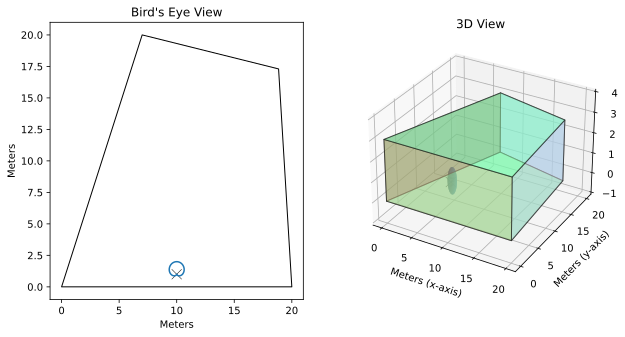

<Figure size 640x480 with 0 Axes>

Room SR: 44100Hz, Microphone(s): x1, Source(s): x0


In [10]:
# Test
room, perimeter = single_mic_setup(room_perimeter=perimeter,
                                   room_volume=room,
                                   mic_coords=mic_coords,
                                   mic_elev=elevation,
                                   directivity=directivity,
                                   debug=True)

In [11]:
def binaural_mic_setup(room_perimeter, room_volume, center_coords: list, mic_elev: float, rotation: int, debug: bool = False):
    """
    Place a binaural Microphones set-up (w. directivity patterns) inside the Room, given center coordinates
    """
    interaural_distance = 0.22                                                  # in meters
    colatitude = 90 + 25                                                        # in °
    mic_pattern = DirectivityPattern.CARDIOID

    # Binaural set-up (mics coords & directivity patterns)
    left_mic_coords = [center_coords[0] - interaural_distance, center_coords[1], elevation]
    left_mic_dir = CardioidFamily(orientation=DirectionVector(azimuth=180 - 5 + rotation, colatitude=colatitude, degrees=True),
                                  pattern_enum=mic_pattern)
    right_mic_coords = [center_coords[0] + interaural_distance, center_coords[1], elevation]
    right_mic_dir = CardioidFamily(orientation=DirectionVector(azimuth=0 + 5 + rotation, colatitude=colatitude, degrees=True),
                                   pattern_enum=mic_pattern)

    # Microphone array positioning
    mic_locs = np.c_[left_mic_coords, right_mic_coords]
    room.add_microphone_array(mic_locs, directivity=[left_mic_dir, right_mic_dir], fs=room.fs)

    # Plot
    if debug is True:
        room_perimeter.add_microphone_array(mic_locs, directivity=[left_mic_dir, right_mic_dir], fs=room.fs)

        fig = plt.figure(figsize=(10, 5))
        ax1 = plt.subplot(121)
        ax2 = plt.subplot(122, projection='3d')

        room_perimeter.plot(ax=ax1, mic_marker_size=100)
        ax1.set_title("Bird's Eye View")
        ax1.set_xlim([room_perimeter.get_bbox()[0][0] - 1, room_perimeter.get_bbox()[0][1] + 1])
        ax1.set_ylim([room_perimeter.get_bbox()[1][0] - 1, room_perimeter.get_bbox()[1][1] + 1])
        ax1.set_xlabel('Meters')
        ax1.set_ylabel('Meters')

        room.plot(ax=ax2, mic_marker_size=100)
        ax2.set_title('3D View')
        ax2.set_xlim([room.get_bbox()[0][0] - 1, room.get_bbox()[0][1] + 1])
        ax2.set_ylim([room.get_bbox()[1][0] - 1, room.get_bbox()[1][1] + 1])
        ax2.set_zlim([room.get_bbox()[2][0] - 1, room.get_bbox()[2][1] + 1])
        ax2.set_xlabel('Meters (x-axis)')
        ax2.set_ylabel('Meters (y-axis)')
        ax2.set_zlabel('Meters (z-axis)')

        plt.tight_layout
        plt.show()

        print(f'Room SR: {room.fs}Hz, Microphone(s): x{room.n_mics}, Source(s): x{room.n_sources}')

    return room, room_perimeter

# Source(s)

approximated as *Omnidirectional*
1. Read audio file
2. Trajectory synthesis:
    - rectilinear
    - curved (*TO DO* )
3. Source(s) positioning

In [12]:
def read_audio_file(path: str, debug: bool = False):
    """
    Read an audio file, given its path string (name & extension included)
    """
    sig_array, sr = sf.read(path, dtype='float64')
    size = sig_array.shape[0]
    duration = size / sr

    # File features & Playback Widget
    if debug is True:
        print(f'File Path      : {path}')
        print(f'Audio length   : {size} samples')
        print(f'Audio duration : {duration} sec.')
        print(f'Audio channels : {sig_array.shape[1] if sig_array.ndim > 1 else 1}')
        print(f'Sample Rate    : {sr} Hz')

    return sig_array, sr, size, duration

In [14]:
# Test
in_sig, sr, size, dur = read_audio_file(path=file_path, debug=True)
print()
IPython.display.Audio(in_sig, rate=sr, normalize=False)

File Path      : ./adult_female_speech_44100_24.wav
Audio length   : 705600 samples
Audio duration : 16.0 sec.
Audio channels : 1
Sample Rate    : 44100 Hz



### Rectilinear Trajectory

In [15]:
def rectilinear_trajectory(start_point: tuple, end_point: tuple, speed: float, sampling_interval: int or float, duration: int or float, debug: bool = False):
    """
    Compute a Rectilinear Trajectory sampling for PRA source(s) set-up
    """
    start_x, start_y = start_point
    end_x, end_y = end_point

    distance_x = end_x - start_x
    distance_y = end_y - start_y
    total_distance = np.sqrt(distance_x**2 + distance_y**2)
    print(f'Total Distance: {total_distance} m')

    required_speed = total_distance / duration

    if speed < required_speed:
        speed = required_speed
        print(f"Speed Re-TUNED! Trajectory speed: {speed} m/s")

    total_time = total_distance / speed
    print(f'...for a Total Time: {total_time} sec.')

    num_points = int(total_time / sampling_interval) + 1

    x_points = np.linspace(start_x, end_x, num_points)
    y_points = np.linspace(start_y, end_y, num_points)

    trajectory_points = list(zip(x_points, y_points))

    # Plot
    if debug is True:
        plt.figure(figsize=(10, 5))
        plt.scatter(x_points, y_points, marker='o')
        plt.scatter((start_point[0], end_point[0]), (start_point[1], end_point[1]), color='red', marker='X', label='Start/End')
        plt.title('Trajectory')
        plt.xlabel('X-axis (meters)')
        plt.ylabel('Y-axis (meters)')
        plt.grid(True)
        plt.legend(loc='best')

        plt.show()

    return trajectory_points, speed

Total Distance: 13.5 m
Speed Re-TUNED! Trajectory speed: 0.84375 m/s
...for a Total Time: 16.0 sec.


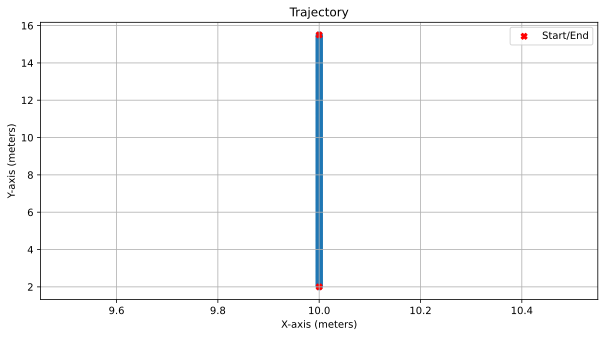


Trajectory Points: 321


In [16]:
# Test
trajectory, correct_speed = rectilinear_trajectory(start_point, end_point, speed, sampling_interval, duration, debug=True)
print()
print(f'Trajectory Points: {len(trajectory)}')

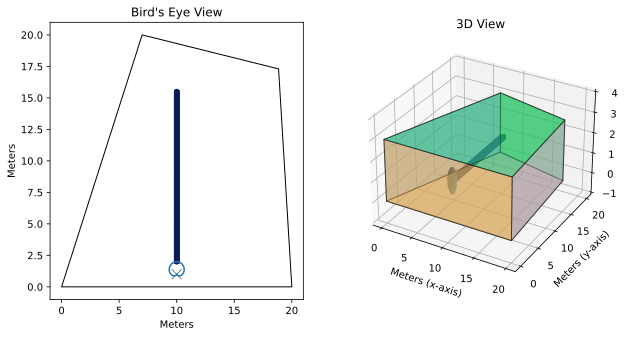

<Figure size 640x480 with 0 Axes>

Room SR: 44100Hz, Microphone(s): x1, Source(s): x321


In [17]:
# Source(s) Positioning
for i in range(len(trajectory)):
    room.add_source([trajectory[i][0], trajectory[i][1], elevation],
                    signal=in_sig,
                    delay=0)

#Plot (DEBUG)
fig = plt.figure(figsize=(10, 5))
ax1 = plt.subplot(121)
ax2 = plt.subplot(122, projection='3d')

perimeter.plot(ax=ax1, mic_marker_size=100)
ax1.set_title("Bird's Eye View")
ax1.set_xlim([perimeter.get_bbox()[0][0] - 1, perimeter.get_bbox()[0][1] + 1])
ax1.set_ylim([perimeter.get_bbox()[1][0] - 1, perimeter.get_bbox()[1][1] + 1])
ax1.set_xlabel('Meters')
ax1.set_ylabel('Meters')

room.plot(ax=ax2, mic_marker_size=100)
ax2.set_title('3D View')
ax2.set_xlim([room.get_bbox()[0][0] - 1, room.get_bbox()[0][1] + 1])
ax2.set_ylim([room.get_bbox()[1][0] - 1, room.get_bbox()[1][1] + 1])
ax2.set_zlim([room.get_bbox()[2][0] - 1, room.get_bbox()[2][1] + 1])
ax2.set_xlabel('Meters (x-axis)')
ax2.set_ylabel('Meters (y-axis)')
ax2.set_zlabel('Meters (z-axis)')

plt.tight_layout
plt.show()

print(f'Room SR: {room.fs}Hz, Microphone(s): x{room.n_mics}, Source(s): x{room.n_sources}')

### Curved Trajectory

In [70]:
def calculate_circle_center(start_point: np.ndarray, end_point: np.ndarray, radius: int or float):
    """
    Compute the center of a circumference interpolated between two given points and radius.
    """
    mid_point = (start_point + end_point) / 2
    distance = np.linalg.norm(start_point - end_point)

    # Minimum radius evaluation
    if distance > 2 * radius:
        raise ValueError("'radius' provided is TOO BIG!")

    # Distance between center and middle-point of circles' chord
    h = np.sqrt(radius ** 2 - (distance / 2) ** 2)

    # Perpendicular vector computation
    direction = np.array([end_point[1] - start_point[1], start_point[0] - end_point[0]])
    direction = direction / np.linalg.norm(direction)

    # Two possible circle centers
    center_1 = mid_point + h * direction
    center_2 = mid_point - h * direction

    return center_1, center_2

def curve_trajectory(start_point: tuple, end_point: tuple, radius: int or float, speed: float, sampling_interval: int or float, duration: int or float, debug: bool = False):
    """
    Compute a Curved Trajectory sampling for PRA source(s) set-up
    """
    start_point = np.array(start_point)
    end_point = np.array(end_point)

    # Minimum radius evaluation
    min_radius = np.linalg.norm(start_point - end_point) / 2
    if radius < min_radius:
        radius = min_radius
        print(f"Radius Re-TUNED! Actual radius {radius} m")

    # Compute circle centers & selection
    center_1, center_2 = calculate_circle_center(start_point, end_point, radius)
    center = center_1 if np.linalg.norm(center_1) < np.linalg.norm(center_2) else center_2
    if debug is True:
        print(f'Center coordinates: {center}')

    # Compute angles of start and end points w.r.t selected center
    angle_1 = np.arctan2(start_point[1] - center[1], start_point[0] - center[0])
    angle_2 = np.arctan2(end_point[1] - center[1], end_point[0] - center[0])

    # Ensure angles are ordered correctly
    if angle_1 > angle_2:
        angle_1, angle_2 = angle_2, angle_1

    arc_length = radius * (angle_2 - angle_1)
    if debug is True:
        print(f'Arc Length: {arc_length} meters')

    required_speed = arc_length / duration
    if speed < required_speed:
        speed = required_speed
        print(f"Speed Re-TUNED! Trajectory speed: {speed} m/s")

    total_time = arc_length / speed
    if debug is True:
        print(f'...for a Total Time: {total_time} sec.')

    num_points = int(total_time / sampling_interval) + 1

    # Sample trajectory points
    angles = np.linspace(angle_1, angle_2, num_points)
    x_points = center[0] + radius * np.cos(angles)
    y_points = center[1] + radius * np.sin(angles)

    trajectory_points = list(zip(x_points, y_points))

    # Plot
    if debug:
        plt.figure(figsize=(7, 7))
        plt.scatter(x_points, y_points, marker='o')
        plt.scatter((start_point[0], end_point[0]), (start_point[1], end_point[1]), color='red', marker='X', label='Start/End')
        plt.title('Trajectory')
        plt.xlabel('X-axis (meters)')
        plt.ylabel('Y-axis (meters)')
        plt.grid(True)
        plt.legend(loc='best')
        plt.show()

    return trajectory_points, speed

Radius Re-TUNED! Actual radius 6.75 m
Center coordinates: [10.    8.75]
Arc Length: 21.205750411731103 meters
Speed Re-TUNED! Trajectory speed: 1.325359400733194 m/s
...for a Total Time: 16.0 sec.


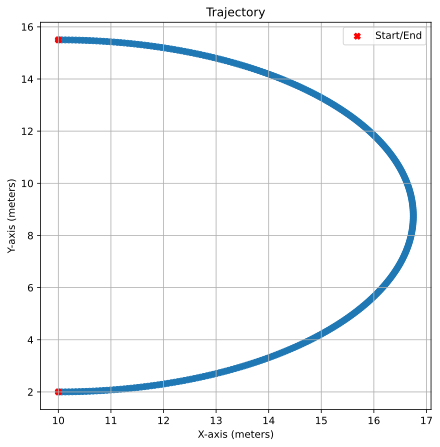


Trajectory Points: 321


In [77]:
# Test
trajectory, correct_speed = curve_trajectory(start_point=start_point, end_point=end_point,
                                             radius=0.2,
                                             speed=speed,
                                             sampling_interval=sampling_interval,
                                             duration=duration,
                                             debug=True)
print()
print(f'Trajectory Points: {len(trajectory)}')

# ISM Simulation + RIRs computation
- *J. B. Allen, D. A. Berkley, ["Image method for efficiently simulating small‐room acoustics"](https://doi.org/10.1121/1.2003643)*

In [ ]:
def ISM_RIR(room, trajectory, debug: bool = False):
    """
    Compute the ISM simulation and extract related RIR(s)
    """
    start = perf_counter()
    room.image_source_model()                                                   # ISM activation
    stop = perf_counter()
    print(f'ISM rendering      : {(stop - start):.2f} sec.')
    start = perf_counter()
    room.compute_rir()                                                          # Fixed Source RIR computation
    stop = perf_counter()
    print(f'RIR(s) computation : {(stop - start):.2f} sec.')

    # Remove Global Delay
    rir_list = []
    if len(room.rir[0]) > 1:
        for i in range(len(room.rir[0])):
            rir_list.append(room.rir[0][i][pra.constants.get("frac_delay_length") // 2 :])
    else:
        rir_list = room.rir[0][pra.constants.get("frac_delay_length") // 2 :]

    # Plot
    if debug is True:
        fig, ax = room.plot(img_order=1, figsize=(10, 5), mic_marker_size=100)
        ax.set_xlabel('Meters')
        ax.set_ylabel('Meters')
        ax.set_zlabel('Meters')
        ax.set_title('3D ISM Model (1st Order only)')
        plt.show()

        plt.figure(figsize=(10, 3.5 * room.n_sources))
        for i in range(room.n_sources):
            plt.subplot(room.n_sources, 1, i + 1)
            plt.plot(np.arange(len(room.rir[0][i][pra.constants.get("frac_delay_length") // 2 :])) / room.fs, room.rir[0][i][pra.constants.get("frac_delay_length") // 2 :])
            plt.title(f'Room Impulse Response {i + 1}, source coords: {trajectory[i]}')
            plt.xlabel('Time (sec.)')
            plt.ylim(-1.1, 1.1)
            plt.ylabel('Amplitude')
            plt.grid(True)

        plt.tight_layout()
        plt.show()

    return rir_list

In [ ]:
# Test (for 12th order ...it takes around 6min)
rir_list = ISM_RIR(room, trajectory, debug=False)

ISM rendering      : 362.28 sec.
RIR(s) computation : 15.85 sec.


# Time-varying Convolution

## "Sliding" RIRs Convolution (direct)

Clicks!

In [ ]:
# Convolution array initialization & Inputs Zero-padding (a.k.a. "full")
big_rir_idx = np.argmax([len(rir_vector) for rir_vector in rir_list])
conv_size = in_sig.shape[0] + rir_list[big_rir_idx].size - 1
conv_out = np.zeros(conv_size, dtype=float)
x_in_pad = np.pad(in_sig, (0, conv_size - in_sig.size), 'constant', constant_values=(0., 0.))

new_rir_list = []
# Zero-padding for each RIR
for i in range(len(rir_list)):
    new_rir_list.append(np.pad(rir_list[i], (0, conv_size - rir_list[i].size), 'constant', constant_values=(0., 0.)))

# Trajectory sampling_interval conversion (in samps)
samp_int = int(sampling_interval * sr)

# Turn List of Python arrays into a NumPy Matrix (avoiding Numba warnings...)
rir_array = np.array(new_rir_list)
rir_array.shape

(321, 732117)

In [ ]:
@jit(nopython=True)
def dyn_dir_convolution(x_in, rir_list, sampling_interval, conv_size, conv_out):
    """
    Direct convolution algorithm (JIT compiled to speed-up) w. RIRs changing
    """
    # Initialize RIRs index
    rir_idx = 0

    # Convolution loop
    for i in range(conv_size):
        acc = 0
        for n in range(i + 1):
            acc += x_in[i-n] * rir_list[rir_idx][n]

        conv_out[i] = acc

        # Evaluate RIR change
        if i != 0:                                                              # Avoid 1st sample (index = 0) evaluation
            if i % sampling_interval == 0:
                if rir_idx < len(rir_list) - 1:
                    rir_idx += 1

    return conv_out

In [ ]:
# Test (for Exp(2) ...it takes around 6min)
conv_out = dyn_dir_convolution(x_in_pad, rir_array, samp_int, conv_size, conv_out)

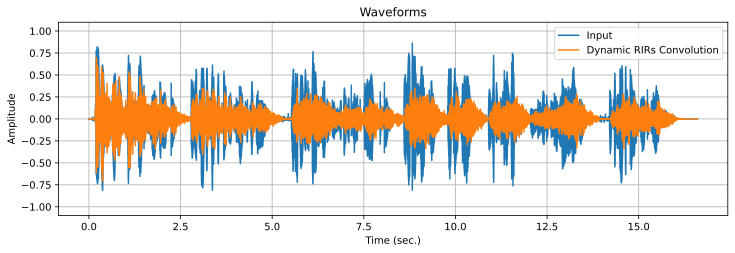

In [ ]:
# Plot (DEBUG)
plt.figure(figsize=(12, 3.5))

plt.plot(np.arange(x_in_pad.size) / sr, x_in_pad, label='Input')
plt.plot(np.arange(conv_out.size) / sr, conv_out, label='Dynamic RIRs Convolution')
plt.title('Waveforms')
plt.xlabel('Time (sec.)')
plt.ylim(-1.1, 1.1)
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend(loc='best')

plt.show()

In [ ]:
IPython.display.Audio(conv_out, rate=sr, normalize=False)

### Interpolation

1. Extract an even surrounding interval of the frame stitch
    - `k`: samples at left and right of the stitch

2. Compute an up-sampled time-base for that buffer
    - `up`: upsampling factor

3. Apply specific interpolation method to extracted stitch buffer w.r.t. up-sampled time-base

4. Decimate (down-sample) the interpolation result, according to `up` factor

5. Compute a "dynamic-mix" of the original and interp-decimated sight buffers according to the given steps:
    - Compute a tapering window (peak at 1, boundaries at 0)
    - Compute the dynamic-mix according to:
        \begin{align}
            y[n] = (1 - w[n]) \cdot s_1[n] + w[n] \cdot s_2[n]
        \end{align}

        with $n$ the sample index, $s_1$ the original stitch buffer and $s_2$ the interp-decimated sight buffer

In [ ]:
# STEP (1)
sight_points = np.arange(samp_int, conv_out.shape[0], samp_int)
k = 50
conv_out_sights = np.zeros((sight_points.size, k * 2), dtype=float)
old_time_ax_sights = np.zeros((sight_points.size, k * 2), dtype=int)

for i in range(sight_points.size):
    conv_out_sights[i] = conv_out[sight_points[i] - k: sight_points[i] + k]
    old_time_ax_sights[i] = np.arange(sight_points[i] - k, sight_points[i] + k)

In [ ]:
# # Print (DEBUG)
# print(f'Sight Indices: {sight_points}')
# print('---------------------------------------------------------------------------------------')
# for i in range(sight_points.size):
#     print(f'Buffer {i + 1}')
#     print(f'Sight Axis   : {old_time_ax_sights[i]}')
#     print(f'Sight Buffers: {conv_out_sights[i]}')
#     print('---------------------------------------------------------------------------------------')

In [ ]:
# STEPs (2-3)
from scipy.interpolate import CubicSpline, PchipInterpolator, Akima1DInterpolator

up_factor = 10
mode = 'spline'                                                                 # Cubic Spline interpolaton
#mode = 'pchip'                                                                  # Piece-wise Cubic Hermite Interpolating Polynomial
#mode = 'akima'                                                                  # Akima method


interp_conv_out_sights = np.zeros((conv_out_sights.shape[0], old_time_ax_sights.shape[1] * up_factor), dtype=float)

for i in range(sight_points.size):
    new_time_ax = np.linspace(start=old_time_ax_sights[i][0],
                              stop=old_time_ax_sights[i][-1],
                              num=old_time_ax_sights[i].size * up_factor)

    if mode == 'akima':
        interp_conv_out_sights[i] = Akima1DInterpolator(old_time_ax_sights[i], conv_out_sights[i], method='akima')(new_time_ax)
    elif mode == 'pchip':
        interp_conv_out_sights[i] = PchipInterpolator(old_time_ax_sights[i], conv_out_sights[i])(new_time_ax)
    else:
        interp_conv_out_sights[i] = CubicSpline(old_time_ax_sights[i], conv_out_sights[i])(new_time_ax)

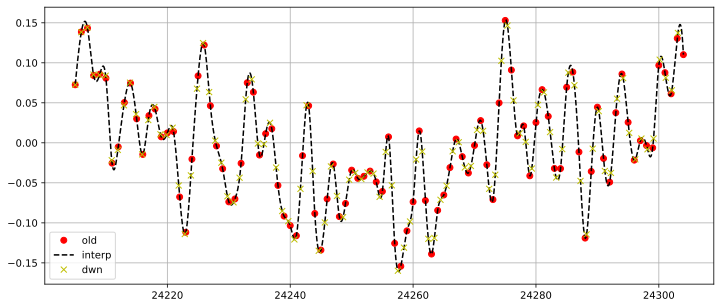

In [ ]:
# Plot (DEBUG)
s_index = 10
plt.figure(figsize=(12, 5))
plt.plot(old_time_ax_sights[s_index], conv_out_sights[s_index], 'ro', label='old')
plt.plot(np.linspace(start=old_time_ax_sights[s_index][0],
                     stop=old_time_ax_sights[s_index][-1],
                     num=old_time_ax_sights[s_index].size * up_factor), interp_conv_out_sights[s_index], 'k--', label='interp')
plt.plot(np.linspace(start=old_time_ax_sights[s_index][0],
                     stop=old_time_ax_sights[s_index][-1],
                     num=old_time_ax_sights[s_index].size * up_factor)[: :up_factor], interp_conv_out_sights[s_index,: :up_factor], 'yx', label='dwn')
plt.legend(loc='best')
plt.grid(True)
plt.show()

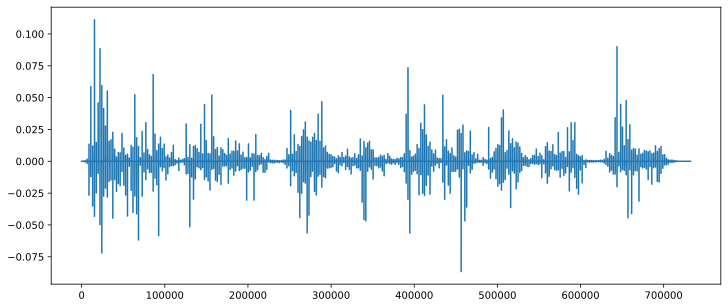

In [ ]:
# STEPs (4-5)
from scipy import signal

interp_conv_out = conv_out.copy()

#win = signal.windows.kaiser(k * 2, beta=14)                                        # Doesn't go perfectly to 0
win = signal.windows.hann(k * 2)
#win = signal.windows.bartlett(k * 2)

for i in range(sight_points.size):
    interp_conv_out[sight_points[i] - k: sight_points[i] + k] = (1 - win) * conv_out_sights[i] + (win * interp_conv_out_sights[i,: :up_factor])

# Plot (DEBUG)
plt.figure(figsize=(12, 5))
plt.plot(conv_out - interp_conv_out)
plt.grid(True)
plt.show()

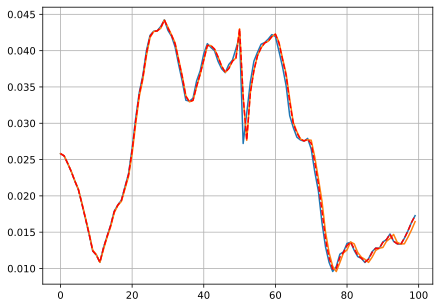

In [ ]:
# Plot (DEBUG)
i = 100
test = (1 - win) * conv_out_sights[i] + (win * interp_conv_out_sights[i,: :up_factor])

plt.figure(figsize=(7, 5))
plt.plot(conv_out_sights[i])
plt.plot(interp_conv_out_sights[i,: :up_factor])
plt.plot(test, 'r--')
plt.grid()
plt.show()

In [ ]:
IPython.display.Audio(interp_conv_out, rate=sr, normalize=False)

## FFT Method

In [ ]:
# Convolutions
conv_outs = []
sizes = []
for i in range(len(rir_list)):
    i_conv = signal.convolve(in_sig, rir_list[i], mode='full')
    sizes.append(len(i_conv))
    conv_outs.append(i_conv)
print(f'Total Convolutions Computed : {len(conv_outs)}')
print(f'MIN Output dur: {np.min(sizes)}, MAX Output dur: {np.max(sizes)}')

Total Convolutions Computed : 321
MIN Output dur: 729241, MAX Output dur: 732113


Window size: 2205 samples
Next Integer Multiple of Window Size: 734265


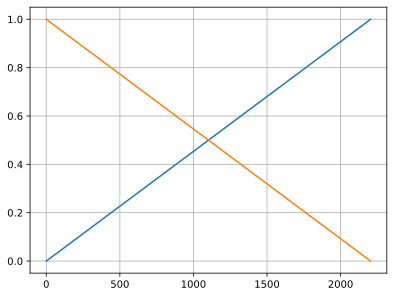

In [ ]:
# Frame fades laws
win_size = int(sampling_interval * sr)
print(f'Window size: {win_size} samples')
next_int_multiple = np.max(sizes) + (win_size - np.max(sizes) % win_size)
print(f'Next Integer Multiple of Window Size: {next_int_multiple}')

fade_in = np.linspace(0., 1., win_size)
fade_out = np.linspace(1., 0., win_size)

plt.plot(fade_in)
plt.plot(fade_out)
plt.grid(True)
plt.show()

In [ ]:
# Causal Zero-Padding to Next integer multiple of window size
for i in range(len(conv_outs)):
    conv_outs[i] = np.pad(conv_outs[i], (0, next_int_multiple - len(conv_outs[i])), mode='constant', constant_values=0.)

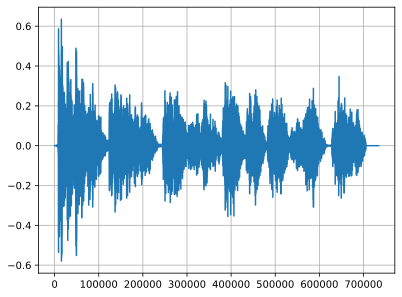

In [ ]:
# Dynamic Convolution Mixing (w. Fade law application)
pointer = 0
iter = 0
out_mix = np.zeros((next_int_multiple, 1), dtype='float')
while iter < len(rir_list) - 1:
    if iter == 0:
        out_mix[: win_size, 0] = conv_outs[0][: win_size] * fade_in
    else:
        fade_out_sig = conv_outs[iter][pointer: pointer + win_size] * fade_out
        fade_in_sig = conv_outs[iter + 1][pointer: pointer + win_size] * fade_in
        out_mix[pointer : pointer + win_size, 0] = fade_out_sig + fade_in_sig

    pointer += win_size
    iter +=1

plt.plot(out_mix)
plt.grid()
plt.show()

In [ ]:
# Max_val Normalization required for interactive playback
#IPython.display.Audio(out_mix[:, 0] / np.max(np.abs(out_mix[:, 0])), rate=sr, normalize=False)
IPython.display.Audio(out_mix[:, 0], rate=sr, normalize=False)

# Room Acoustic Features (TO DO)

*REFERENCES:*
- **PyRoomAcoustics "Room Acoustics Features"**: https://pyroomacoustics.readthedocs.io/en/pypi-release/pyroomacoustics.metrics.html#pyroomacoustics.metrics

- S. Giacomelli, [*Analisi comparativa dei modelli e dei descrittori documentati per la risposta acustica degli spazi di ascolto*](https://drive.google.com/file/d/1sMuHVt8J7tCP-q12DtEexxZZ_GP37ISk/view?usp=drive_link) (Conservatorio A. Casella di L'Aquila, MUSEL Dept.)